### Analysis of ADAM's Unified Observation Dataset (UOD) 

This notebook was generated by using a local copy of the UOD. Downloaded via `gsutil`:

```
gsutil -m rsync -r -d -c gs://adam-dataset-dev/production/dagster/complete_precovery_db /mnt/data/projects/precovery/precovery_data
```

In [1]:
import os

UOD = "/mnt/data/projects/precovery/precovery_data"
FRAME_DB = os.path.join(UOD, "index.db")
! du -sh {UOD}
! du -sh {FRAME_DB}

300G	/mnt/data/projects/precovery/precovery_data
888M	/mnt/data/projects/precovery/precovery_data/index.db


Let's run a precovery search against the UOD for a risk list object (to make sure things are working).

In [2]:
import numpy as np
import pandas as pd
import sqlite3 as sql
from astropy.time import Time
from astroquery.jplsbdb import SBDB

from precovery.orbit import Orbit
from precovery.orbit import EpochTimescale


result = SBDB.query("2018 BP3", full_precision=True, phys=True)

# Extract the epoch into a Time object
epoch = Time(result["orbit"]["epoch"], scale="tdb", format="jd")
epoch_tt_mjd = epoch.tt.mjd

# Extract physical characteristics if they exit
if "phys_par" in result:
    if "H" in result["phys_par"]:
        H = result["phys_par"]["H"]
    else:
        H = 20.0

    if "G" in result["phys_par"]:
        G = result["phys_par"]["G"]
    else:
        G = 0.15

# Define a precovery orbit
orbit = Orbit.cometary(
    0,
    result["orbit"]["elements"]["q"].value,
    result["orbit"]["elements"]["e"],
    result["orbit"]["elements"]["i"].value,
    result["orbit"]["elements"]["om"].value,
    result["orbit"]["elements"]["w"].value,
    result["orbit"]["elements"]["tp"].value - 2400000.5,
    epoch_tt_mjd,
    EpochTimescale.TT,
    H, 
    G,
)

In [3]:
result["orbit"]["elements"]

OrderedDict([('e', 0.2581109345910674),
             ('e_sig', 0.00010279),
             ('a', <Quantity 1.15050482 AU>),
             ('a_sig', <Quantity 7.1399e-05 AU>),
             ('q', <Quantity 0.85354694 AU>),
             ('q_sig', <Quantity 6.5297e-05 AU>),
             ('i', <Quantity 1.41809821 deg>),
             ('i_sig', <Quantity 0.00085657 deg>),
             ('om', <Quantity 306.82104987 deg>),
             ('om_sig', <Quantity 0.0061903 deg>),
             ('w', <Quantity 103.28973115 deg>),
             ('w_sig', <Quantity 0.0016184 deg>),
             ('ma', <Quantity 91.90638032 deg>),
             ('ma_sig', <Quantity 0.21141 deg>),
             ('tp', <Quantity 2459885.42678428 d>),
             ('tp_sig', <Quantity 0.25399 d>),
             ('per', <Quantity 450.74517693 d>),
             ('per_sig', <Quantity 0.041959 d>),
             ('n', <Quantity 0.79867743 deg / d>),
             ('n_sig', <Quantity 7.4347e-05 deg / d>),
             ('ad', <Quantity 1.4

In [4]:
from precovery.main import precover

results = precover(
    orbit, 
    UOD, 
    allow_version_mismatch=True, 
    tolerance=5/3600,
)

Running version: 0.2.dev160+g9988cf8
Database version: 0.2.dev159+gc091c7b
allow_version_mismatch=True, so continuing.
INFO:precovery:precovering orbit 0 from 56193.15343 to 60125.48419, window=7, datasets=all


To grab all observations within some window of time: 

In [5]:
from astropy.time import Time

window = Time(["2013-09-01T00:00:00", "2013-10-01T00:00:00"], scale="utc", format="isot")

In [6]:
from precovery.precovery_db import PrecoveryDatabase
import dataclasses
import sqlite3 as sql
import pandas as pd

db = PrecoveryDatabase.from_dir(UOD, create=False, mode="r", allow_version_mismatch=True)
con = sql.connect(FRAME_DB)
frames_window = pd.read_sql(f"""SELECT * FROM frames WHERE exposure_mjd_start BETWEEN {window[0].mjd} AND {window[1].mjd}""", con)
ids = frames_window["id"].values.tolist()
frames_window = list(db.frames.idx.get_frames_by_id(ids))

observation_dfs = []

for f in frames_window:
    mjds = []
    ras = []
    decs = []
    ra_sigmas = []
    dec_sigmas = []
    mags = []
    mag_sigmas = []
    ids = []
    for o in db.frames.iterate_observations(f):
        mjds.append(o.mjd)
        ras.append(o.ra)
        decs.append(o.dec)
        ra_sigmas.append(o.ra_sigma)
        dec_sigmas.append(o.dec_sigma)
        mags.append(o.mag)
        mag_sigmas.append(o.mag_sigma)
        ids.append(o.id.decode())

    observations_df = pd.DataFrame({
        "obs_id" : ids,
        "mjd_utc": mjds,
        "ra": ras,
        "dec": decs,
        "ra_sigma": ra_sigmas,
        "dec_sigma": dec_sigmas,
        "mag": mags,
        "mag_sigma": mag_sigmas
    })
    for i, (key, value) in enumerate(dataclasses.asdict(f).items()):
        if type(value) == b'':
            value = value.decode()
        observations_df.insert(i, key, value)
    observation_dfs.append(observations_df)

observations = pd.concat(observation_dfs, ignore_index=True)
observations.rename(columns={"id": "frame_id"}, inplace=True)
observations.drop(columns=["dataset_id", "data_uri", "data_offset", "data_length"], inplace=True)
observations.sort_values(by=["mjd_utc"], inplace=True, ignore_index=True)

con.close()

Running version: 0.2.dev160+g9988cf8
Database version: 0.2.dev159+gc091c7b
allow_version_mismatch=True, so continuing.


In [7]:
observations.to_parquet("observations_201309.parquet")

In [8]:
frames = observations.drop_duplicates(subset=["frame_id"])
visits = frames.groupby(by="healpixel").size()

# Filter observations to only include those in healpixels with 6-30 visits (optional)
observations_filtered = observations[observations["healpixel"].isin(visits[(visits >= 6) & (visits <= 30)].index.values)]
observations_filtered.reset_index(drop=True, inplace=True)
observations.to_parquet("observations_201309_filtered.parquet")

Let's now loop through each frame and compute the number of observations in each healpixel and a variety of other statistics.

In [9]:
import numpy as np
import pandas as pd
import sqlite3 as sql

from precovery.precovery_db import PrecoveryDatabase

con = sql.connect(FRAME_DB)
frames = pd.read_sql("""SELECT * FROM frames""", con)

In [10]:
frames.head()

,id,dataset_id,obscode,exposure_id,filter,exposure_mjd_start,exposure_mjd_mid,exposure_duration,healpixel,data_uri,data_offset,data_length
0,1,nsc,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7183,nsc/2019-11/frames_00000001.data,0,783
1,2,nsc,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7216,nsc/2019-11/frames_00000001.data,783,6571
2,3,nsc,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7194,nsc/2019-11/frames_00000001.data,7354,1018
3,4,nsc,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7205,nsc/2019-11/frames_00000001.data,8372,8089
4,5,nsc,W84,c4d_191104_001228_ooi_g_v1,g,58791.008662,58791.009820,200.0,7194,nsc/2019-11/frames_00000001.data,16461,97845


In [11]:
def analyze_frames(frames):

    db = PrecoveryDatabase.from_dir(UOD, create=False, mode="r", allow_version_mismatch=True)

    data = {
        "id": [],
        "num_obs" : [],
        "mag_mean" : [],
        "mag_sigma" : [],
        "mag_p0" : [],
        "mag_p10" : [],
        "mag_p25" : [],
        "mag_p50" : [],
        "mag_p75" : [],
        "mag_p90" : [],
        "mag_p100" : [],
    }


    frame_ids = frames["id"].values.tolist()
    for id_i in frame_ids:

        frame = list(db.frames.idx.get_frames_by_id([id_i]))[0]

        observations = list(db.frames.iterate_observations(frame))

        mag = np.array([o.mag for o in observations])
        mag_percentiles = np.percentile(mag, [0, 10, 25, 50, 75, 90, 100])
        mag_mean = np.mean(mag)
        mag_sigmas = np.std(mag)

        data["id"].append(id_i)
        data["num_obs"].append(len(observations))
        data["mag_mean"].append(mag_mean)
        data["mag_sigma"].append(mag_sigmas)
        for p in zip(mag_percentiles, [0, 10, 25, 50, 75, 90, 100]):
            data["mag_p{}".format(p[1])].append(p[0])


    db.frames.close()
    data = pd.DataFrame(data)

    return data

# Group frames by URI and then lets use a multiprocessing pool to analyze each URI in parallel
frames_per_uri = [v for k, v in frames.groupby("data_uri")]

In [12]:
import multiprocessing as mp

if not os.path.exists("frame_analysis.parquet"):
    pool = mp.Pool(60)
    results = pool.map(analyze_frames, frames_per_uri)
    pool.close()
    pool.join()

    results = pd.concat(results)
    results.sort_values(by="id", inplace=True, ignore_index=True)
    results.to_parquet("frame_analysis.parquet")
else:
    results = pd.read_parquet("frame_analysis.parquet")

In [13]:
results.head()

,id,num_obs,mag_mean,mag_sigma,mag_p0,mag_p10,mag_p25,mag_p50,mag_p75,mag_p90,mag_p100
0,1,10,19.166800,1.014112,17.904034,17.947817,18.196552,19.203083,19.603692,20.710082,20.918606
1,2,84,18.487522,1.229219,15.675141,16.659373,17.745076,18.594448,19.423680,20.076396,20.664434
2,3,13,18.559338,1.008222,16.876226,17.306288,17.951609,18.419567,19.121113,19.682833,20.635878
3,4,103,18.915774,1.162890,15.005179,17.522037,18.298101,18.792004,19.743952,20.609078,21.501453
4,5,1249,20.342707,1.193451,13.122038,19.037251,19.818607,20.502851,21.112137,21.583053,22.629879


In [14]:
import numpy as np
import pandas as pd
import healpy as hp
import sqlite3 as sql
import matplotlib.pyplot as plt

%matplotlib inline

from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.time import Time

In [15]:
# Merge frames with analysis results
frames_av = frames.merge(results, on="id")

# Lets calculate the calendar month of each frame (which we can read from the URI)
frames_av.insert(2, "month", frames_av["data_uri"].apply(lambda x: x.split("/")[1]))
frames_av.head()

,id,dataset_id,month,obscode,exposure_id,filter,exposure_mjd_start,exposure_mjd_mid,exposure_duration,healpixel,...,num_obs,mag_mean,mag_sigma,mag_p0,mag_p10,mag_p25,mag_p50,mag_p75,mag_p90,mag_p100
0,1,nsc,2019-11,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7183,...,10,19.166800,1.014112,17.904034,17.947817,18.196552,19.203083,19.603692,20.710082,20.918606
1,2,nsc,2019-11,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7216,...,84,18.487522,1.229219,15.675141,16.659373,17.745076,18.594448,19.423680,20.076396,20.664434
2,3,nsc,2019-11,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7194,...,13,18.559338,1.008222,16.876226,17.306288,17.951609,18.419567,19.121113,19.682833,20.635878
3,4,nsc,2019-11,W84,c4d_191104_000420_ooi_r_v1,r,58791.003015,58791.003594,100.0,7205,...,103,18.915774,1.162890,15.005179,17.522037,18.298101,18.792004,19.743952,20.609078,21.501453
4,5,nsc,2019-11,W84,c4d_191104_001228_ooi_g_v1,g,58791.008662,58791.009820,200.0,7194,...,1249,20.342707,1.193451,13.122038,19.037251,19.818607,20.502851,21.112137,21.583053,22.629879


In [16]:
frames_av.groupby("obscode")["exposure_mjd_start"].agg(["min", "max"]).apply(lambda x: Time(x, format="mjd", scale="utc").isot, axis=1)

obscode
695    [2016-01-25T07:48:42.000, 2017-08-07T03:51:33....
I41    [2018-06-01T04:01:25.997, 2023-06-30T11:36:59....
Q55    [2014-03-15T15:36:11.000, 2018-03-14T19:01:52....
V00    [2015-11-12T01:40:18.733, 2019-02-28T07:05:51....
W84    [2012-09-23T03:40:41.661, 2019-11-16T01:25:22....
dtype: object

In [17]:
# Exposures per dataset
frames_av.groupby("dataset_id")["exposure_id"].nunique()

dataset_id
nsc          412115
skymapper    121230
ztf          353618
Name: exposure_id, dtype: int64

In [18]:
# Number of observations per observatory code
frames_av.groupby("obscode")["num_obs"].sum() 

obscode
695     191695449
I41      43889732
Q55     563280556
V00      43245396
W84    3180225345
Name: num_obs, dtype: int64

In [19]:
# Number of observations per observatory code as a percentage of total observations
frames_av.groupby("obscode")["num_obs"].sum() / frames_av["num_obs"].sum() * 100

obscode
695     4.765774
I41     1.091150
Q55    14.003815
V00     1.075131
W84    79.064130
Name: num_obs, dtype: float64

In [20]:
# Number of observations per dataset
frames_av.groupby("dataset_id")["num_obs"].sum() 

dataset_id
nsc          3415166190
skymapper     563280556
ztf            43889732
Name: num_obs, dtype: int64

In [21]:
def plot_galactic_plane(latitudes=[15], **kwargs):
    """Side-effectful.. plots on the active figure"""
    coords_galactic_plane = SkyCoord(
        l=np.linspace(0, 360, 3600)*u.deg, 
        b=np.zeros(3600)*u.deg, 
        frame="galactic"
    )
    hp.projplot(
        coords_galactic_plane.icrs.ra.value,
        coords_galactic_plane.icrs.dec.value,
        lonlat=True,
        **kwargs
    )
    for offset_i in latitudes:
        coords_galactic_plane_p = SkyCoord(
            l=np.linspace(0, 360, 3600)*u.deg, 
            b=offset_i*np.ones(3600)*u.deg, 
            frame="galactic"
        )
        coords_galactic_plane_m = SkyCoord(
            l=np.linspace(0, 360, 3600)*u.deg, 
            b=-offset_i*np.ones(3600)*u.deg, 
            frame="galactic"
        )
        hp.projplot(
            coords_galactic_plane_p.icrs.ra.value,
            coords_galactic_plane_p.icrs.dec.value,
            lonlat=True,
            **kwargs
        )
        hp.projplot(
            coords_galactic_plane_m.icrs.ra.value,
            coords_galactic_plane_m.icrs.dec.value,
            lonlat=True,
            **kwargs
        )
    
def plot_ecliptic_plane(latitudes=[15, 30, 45, 60, 75], **kwargs):
    """Side-effectful.. plots on the active figure"""

    coords_ecliptic_plane = SkyCoord(
        lon=np.linspace(0, 360, 3600)*u.deg, 
        lat=np.zeros(3600)*u.deg, 
        frame="barycentrictrueecliptic"
    )
    hp.projplot(
        coords_ecliptic_plane.icrs.ra.value,
        coords_ecliptic_plane.icrs.dec.value,
        lonlat=True,
        **kwargs
    )
    for offset_i in latitudes:
        coords_ecliptic_plane_m = SkyCoord(
            lon=np.linspace(0, 360, 3600)*u.deg, 
            lat=-offset_i*np.ones(3600)*u.deg, 
            frame="barycentrictrueecliptic"
        )
        coords_ecliptic_plane_p = SkyCoord(
            lon=np.linspace(0, 360, 3600)*u.deg, 
            lat=offset_i*np.ones(3600)*u.deg, 
            frame="barycentrictrueecliptic"
        )
    
        hp.projplot(
            coords_ecliptic_plane_p.icrs.ra.value,
            coords_ecliptic_plane_p.icrs.dec.value,
            lonlat=True,
            **kwargs
        )
        hp.projplot(
            coords_ecliptic_plane_m.icrs.ra.value,
            coords_ecliptic_plane_m.icrs.dec.value,
            lonlat=True,
            **kwargs
        )



def calculate_visits_map(frames, nside=32):
    visits = np.log10(frames.groupby(by="healpixel")["id"].size())

    num_pix = hp.nside2npix(nside)
    healpix_map = hp.ma(np.zeros(num_pix))
    healpix_map[visits.index.values] = visits.values
    healpix_map.mask = np.ones(len(healpix_map)) 
    healpix_map.mask[visits.index.values] = False 

    label = "$\log N_{Visits}$"
    return healpix_map, label

def calculate_exposure_map(frames, nside=32):
    exposure = frames.groupby(by="healpixel")["exposure_duration"].sum() / 3600

    num_pix = hp.nside2npix(nside)
    healpix_map = hp.ma(np.zeros(num_pix))
    healpix_map[exposure.index.values] = exposure.values
    healpix_map.mask = np.ones(len(healpix_map)) 
    healpix_map.mask[exposure.index.values] = False 

    label = "Exposure Time [hr]"
    return healpix_map, label 

def calculate_median_p90mag_map(frames, nside=32):

    p90mag = frames.groupby(by="healpixel")["mag_p90"].median()

    num_pix = hp.nside2npix(nside)
    healpix_map = hp.ma(np.zeros(num_pix))
    healpix_map[p90mag.index.values] = p90mag.values
    healpix_map.mask = np.ones(len(healpix_map)) 
    healpix_map.mask[p90mag.index.values] = False 
    
    label="Median $m_{90}$"

    return healpix_map, label

def calculate_max_p90mag_map(frames, nside=32):

    p90mag = frames.groupby(by="healpixel")["mag_p90"].max()

    num_pix = hp.nside2npix(nside)
    healpix_map = hp.ma(np.zeros(num_pix))
    healpix_map[p90mag.index.values] = p90mag.values
    healpix_map.mask = np.ones(len(healpix_map)) 
    healpix_map.mask[p90mag.index.values] = False 
    
    label="Maximum $m_{90}$"

    return healpix_map, label

def plot_map(
        fig, 
        map,
        nest=True, 
        min=0,
        max=4,
        cmap="viridis",
        ecliptic_latitudes=[15, 30, 45, 60, 75],
        galactic_latitudes=[15],
        label="",
    ):

    

    hp.mollview(
        map,
        fig=fig,
        xsize=2000, 
        cmap=cmap,
        badcolor="k", 
        hold=True, 
        nest=nest, 
        sub=0,
        min=min,
        max=max,
        title="",
        cbar=False,
        flip="astro",
    )

    plot_ecliptic_plane(latitudes=ecliptic_latitudes, ls="--", color="cyan", alpha=1.0, lw=0.5)
    plot_galactic_plane(latitudes=galactic_latitudes, ls=":", color="cyan", alpha=1.0, lw=0.5)

    ax = plt.gca()
    image = ax.get_images()[0]
    fig.colorbar(
        image, 
        ax=ax, 
        label=label,
        orientation="horizontal", 
        fraction=0.05, 
        pad=0.05
    )

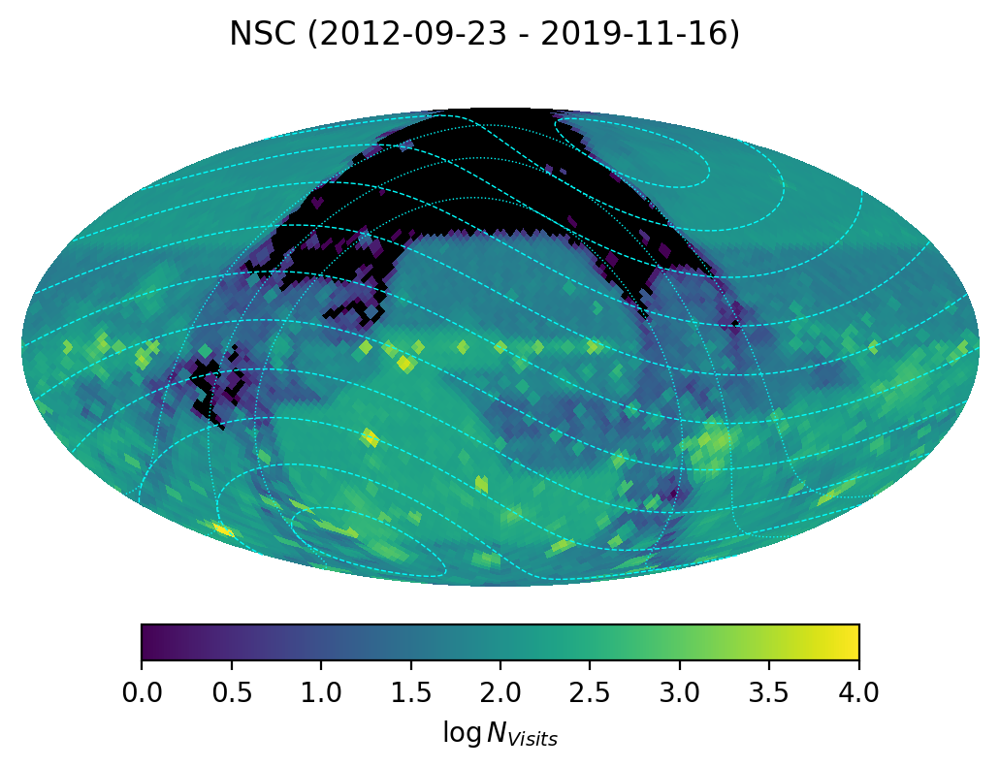

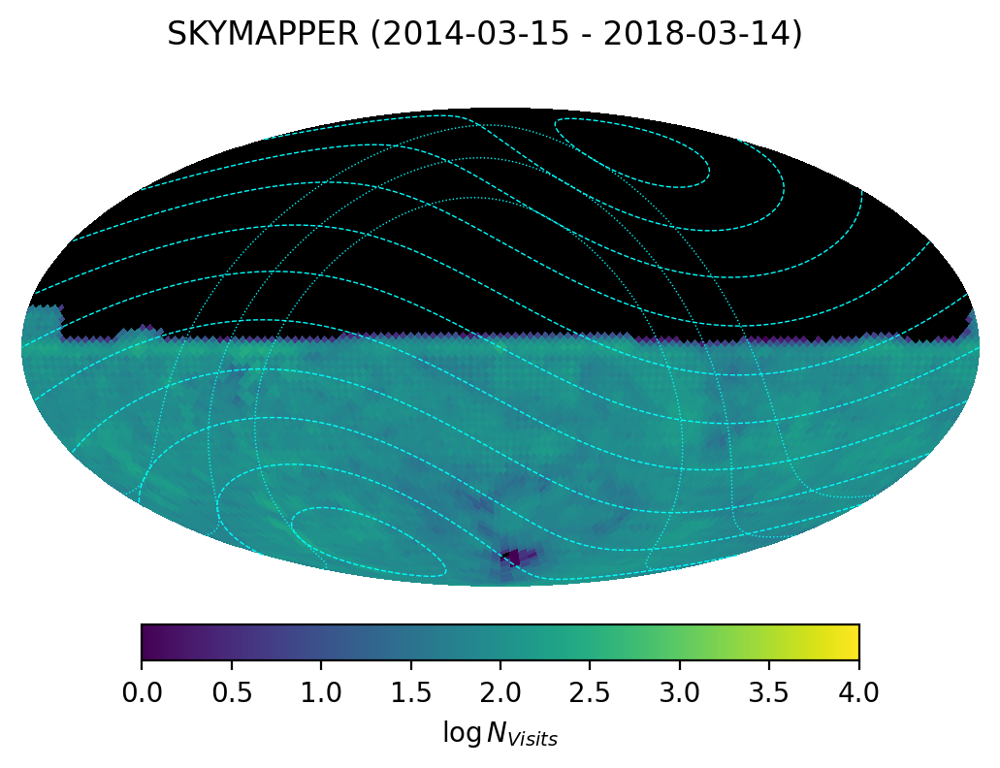

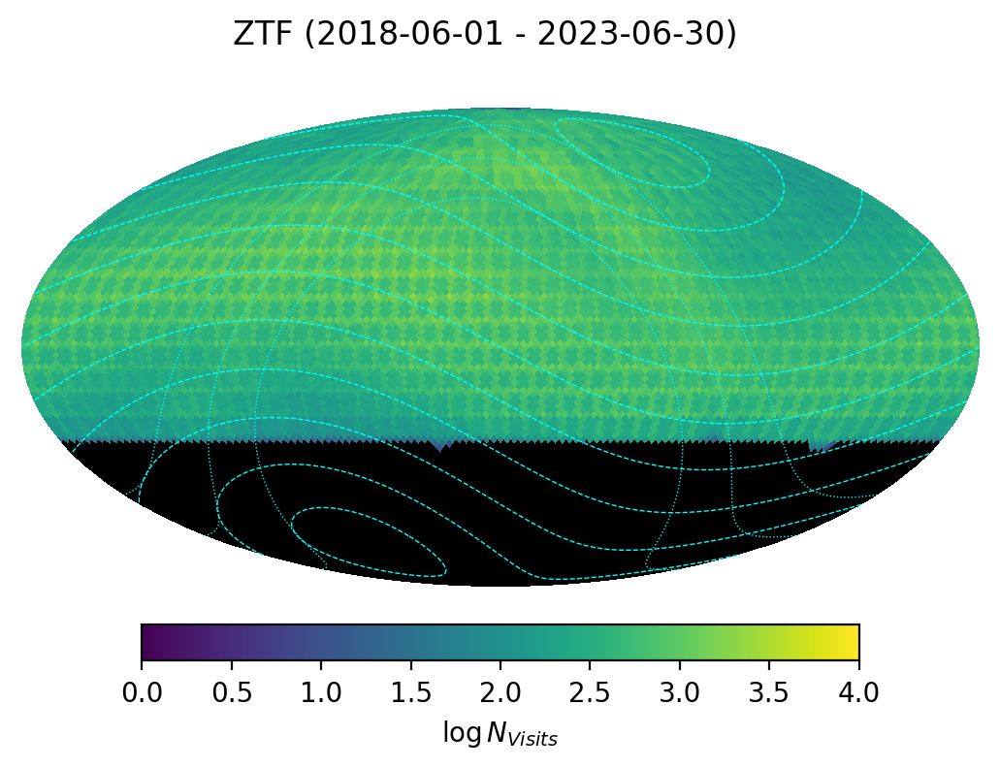

In [22]:
for dataset in ["nsc", "skymapper", "ztf"]:
    frames_dataset = frames[frames["dataset_id"] == dataset]

    range_dataset = Time([
        frames_dataset["exposure_mjd_start"].max(),
        frames_dataset["exposure_mjd_start"].min(),
    ], format="mjd")
    
    fig, ax = plt.subplots(1, 1, dpi=200)
    fig.suptitle(f"{dataset.upper()} ({range_dataset.isot[1].split('T')[0]} - {range_dataset.isot[0].split('T')[0]})", y=0.80)
    healpix_map, label = calculate_visits_map(frames_dataset)
    plot_map(fig, healpix_map, max=4, cmap="viridis", label=label)
    fig.savefig(f"plots/{dataset}_visits_map.png", dpi=200, bbox_inches="tight")

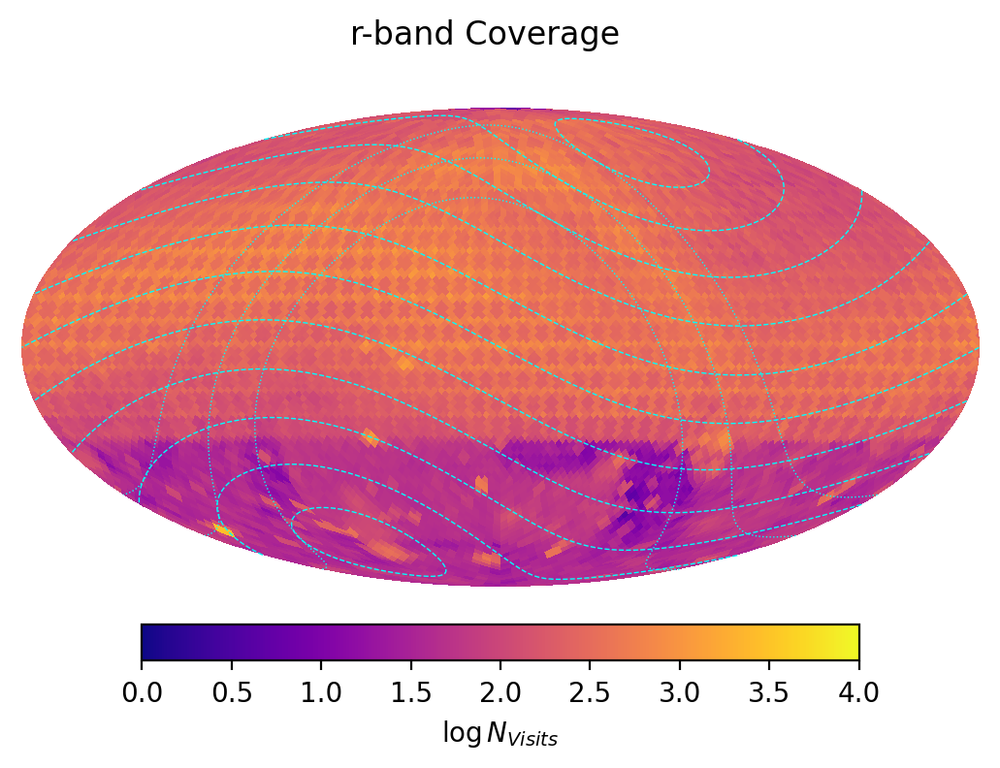

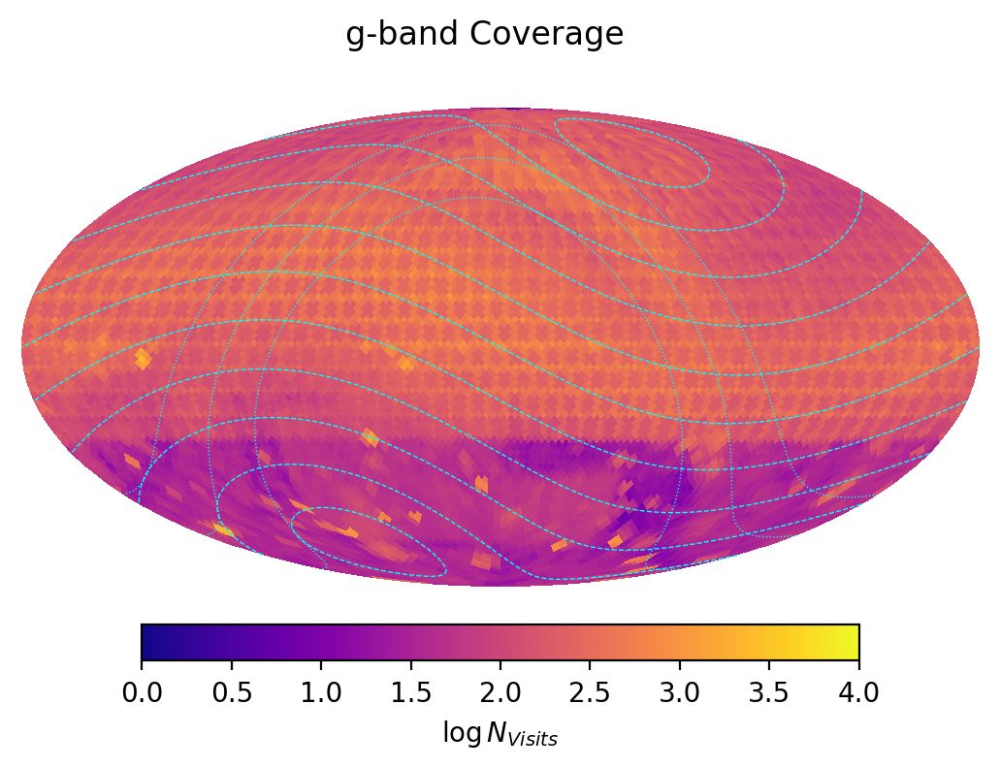

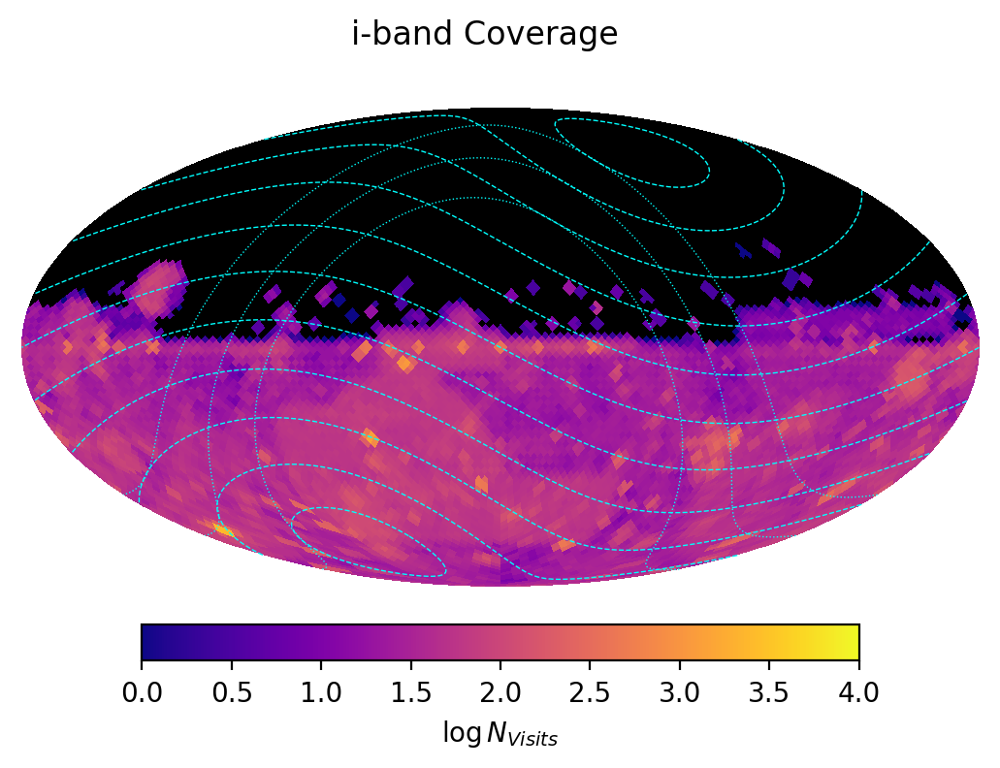

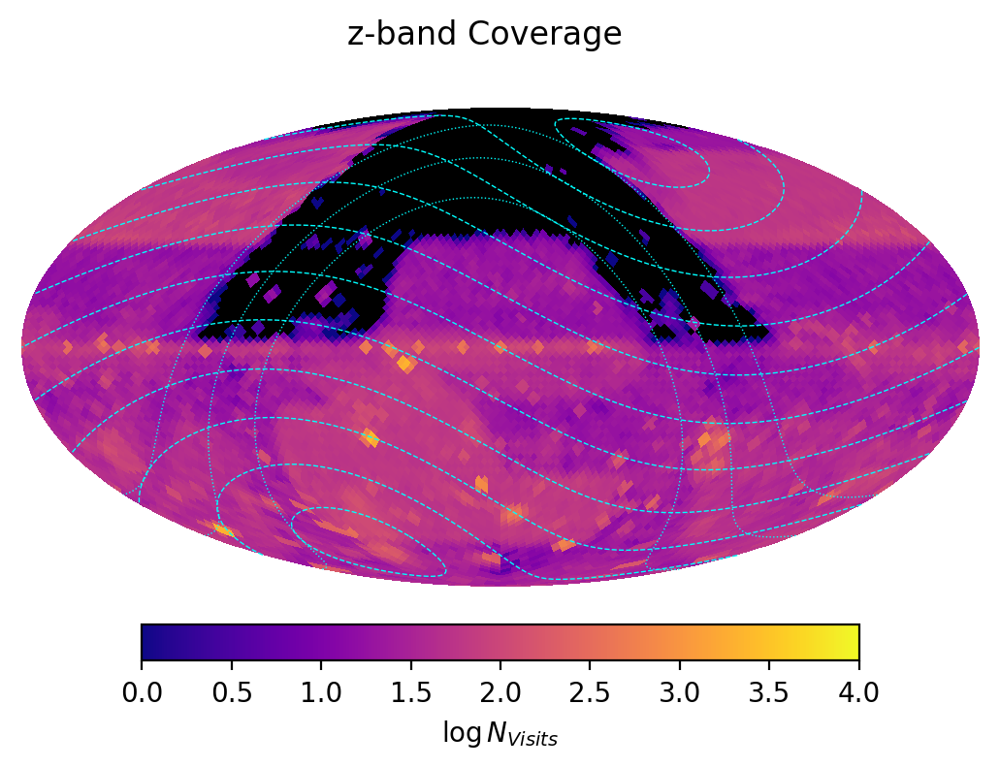

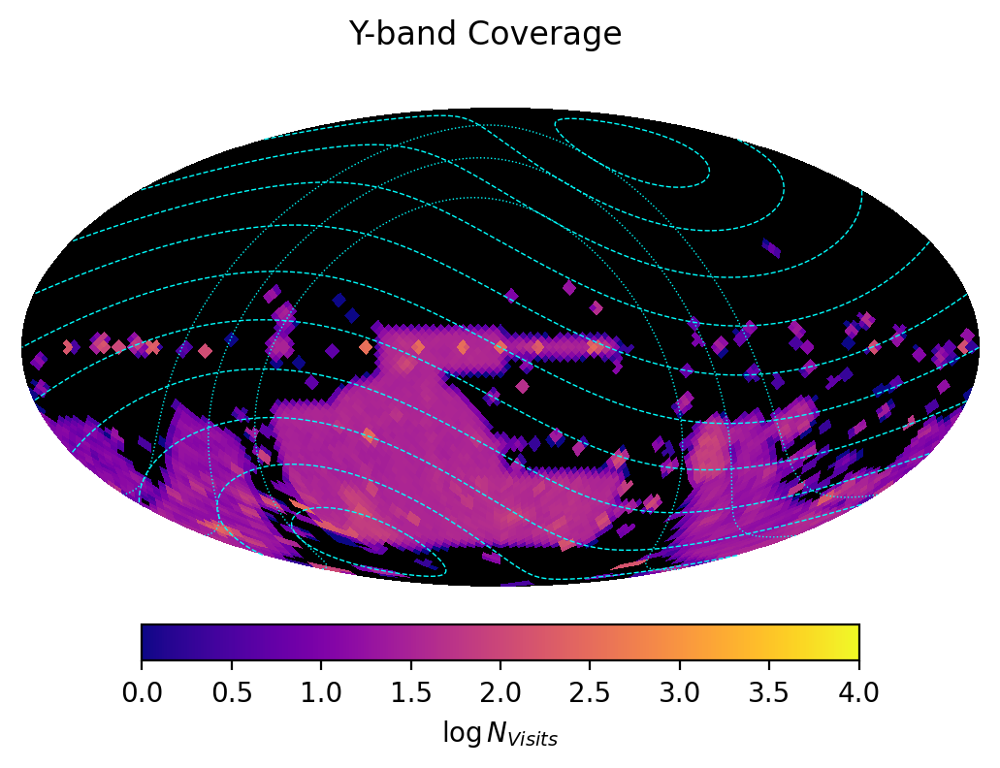

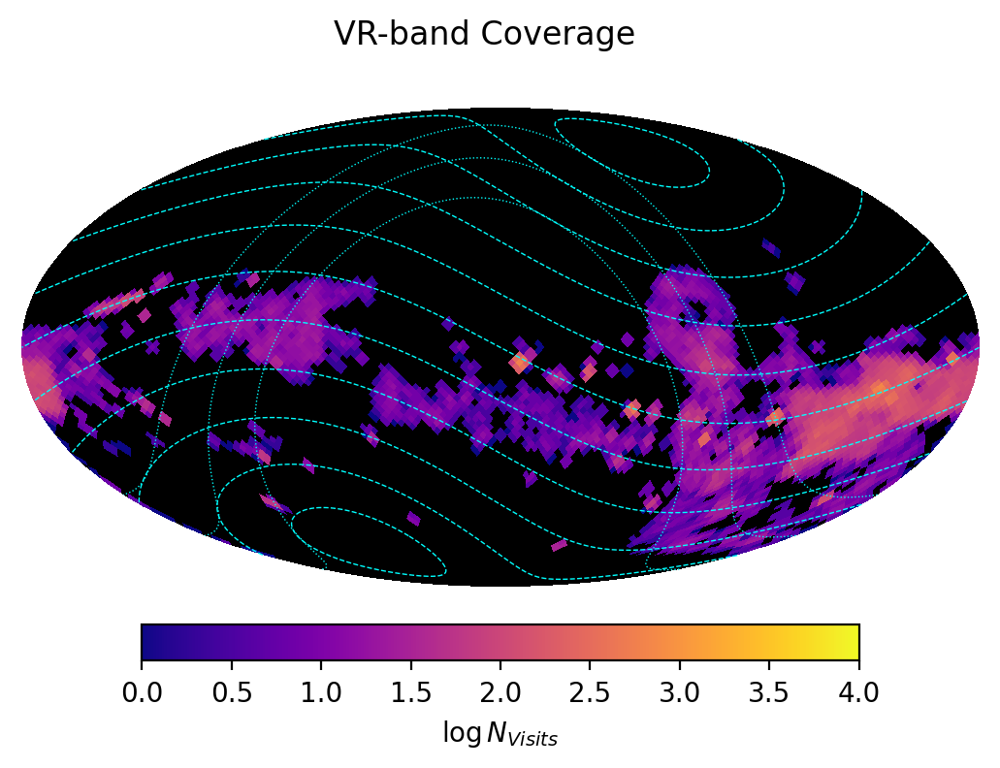

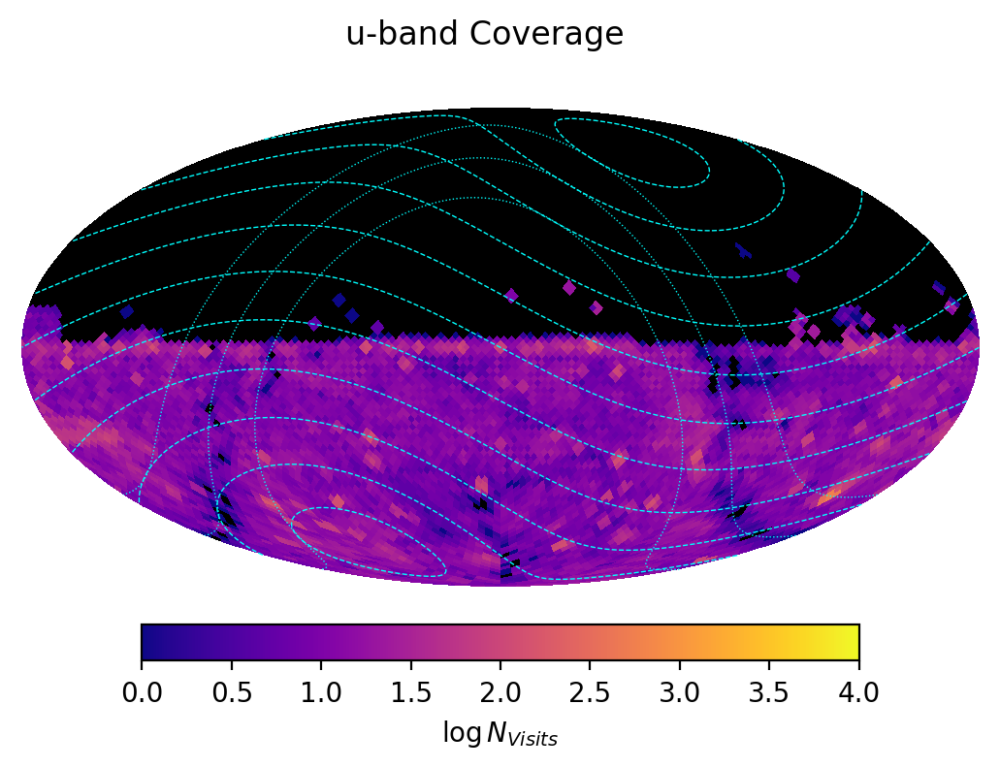

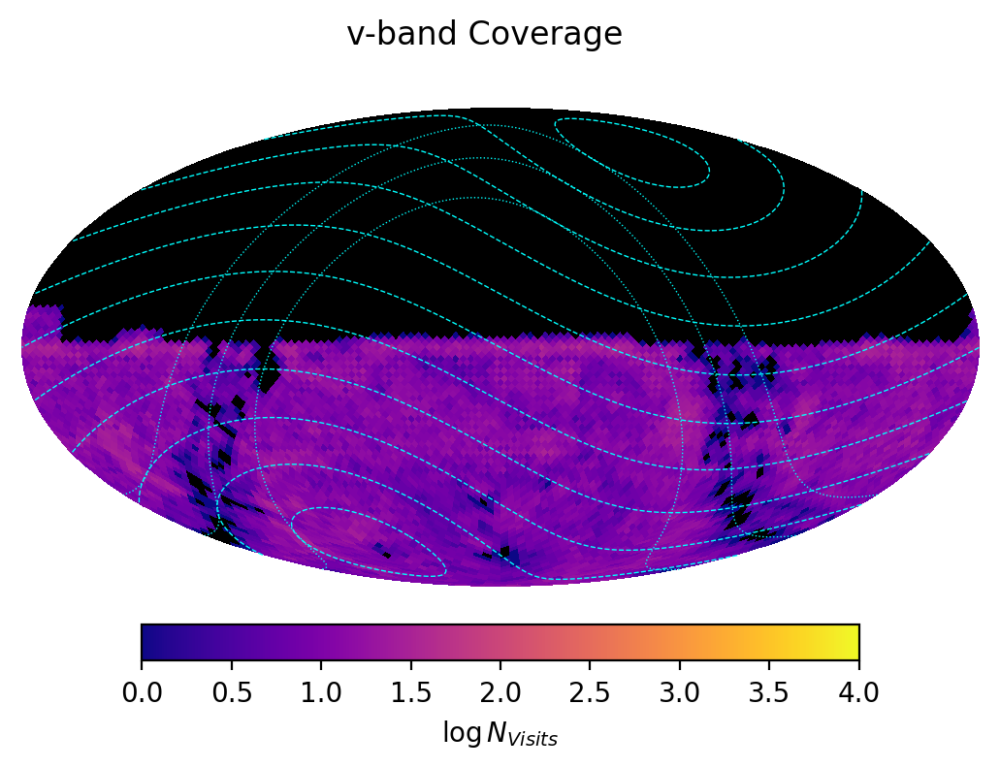

In [23]:
for filter_i in frames["filter"].unique():
    fig, ax = plt.subplots(1, 1, dpi=200)
    fig.suptitle(f"{filter_i}-band Coverage", y=0.80)
    healpix_map, label = calculate_visits_map(frames[frames["filter"] == filter_i], nside=32)
    plot_map(fig, healpix_map, max=4, cmap="plasma", label=label)
    fig.savefig(f"plots/{filter_i}_coverage.png", dpi=200, bbox_inches="tight")

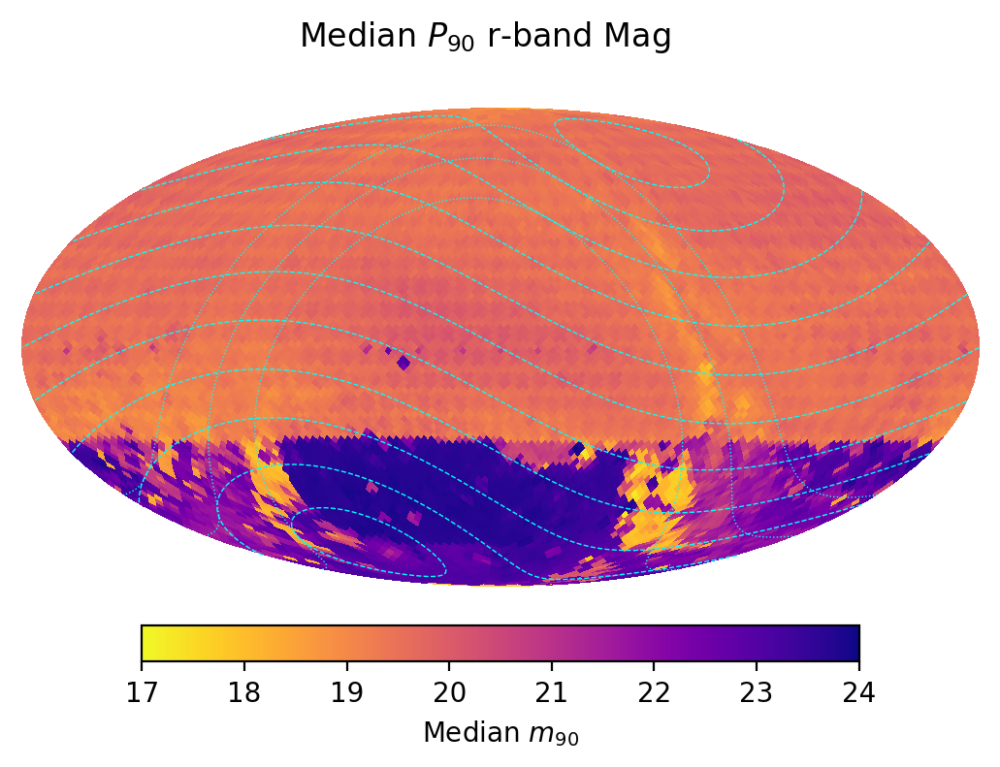

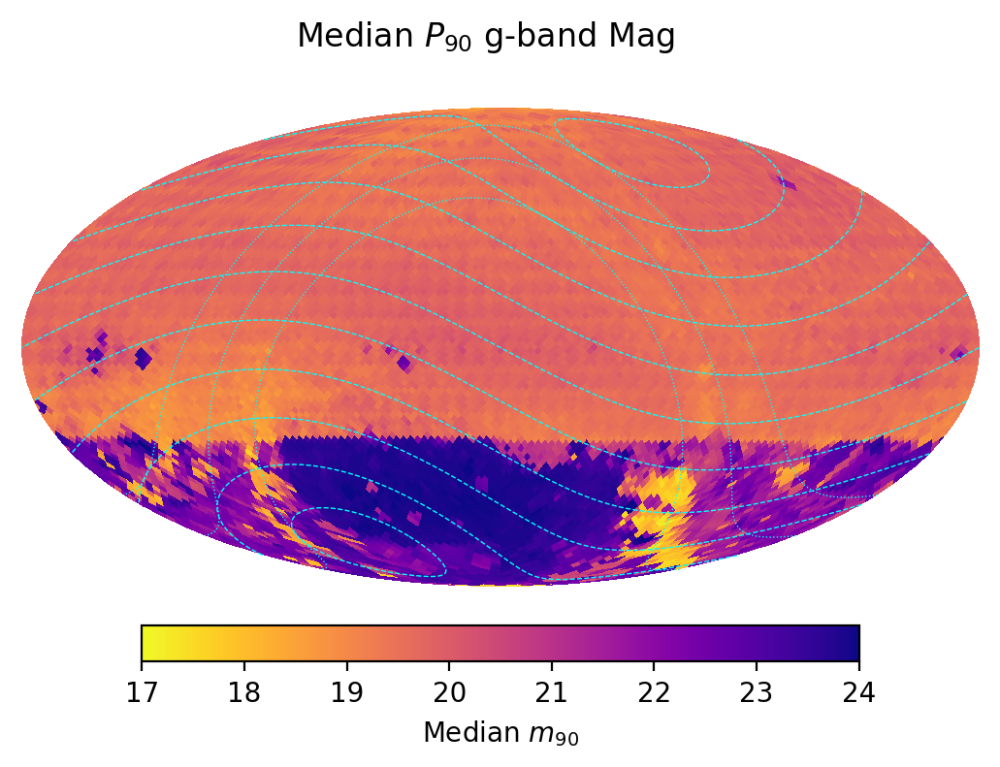

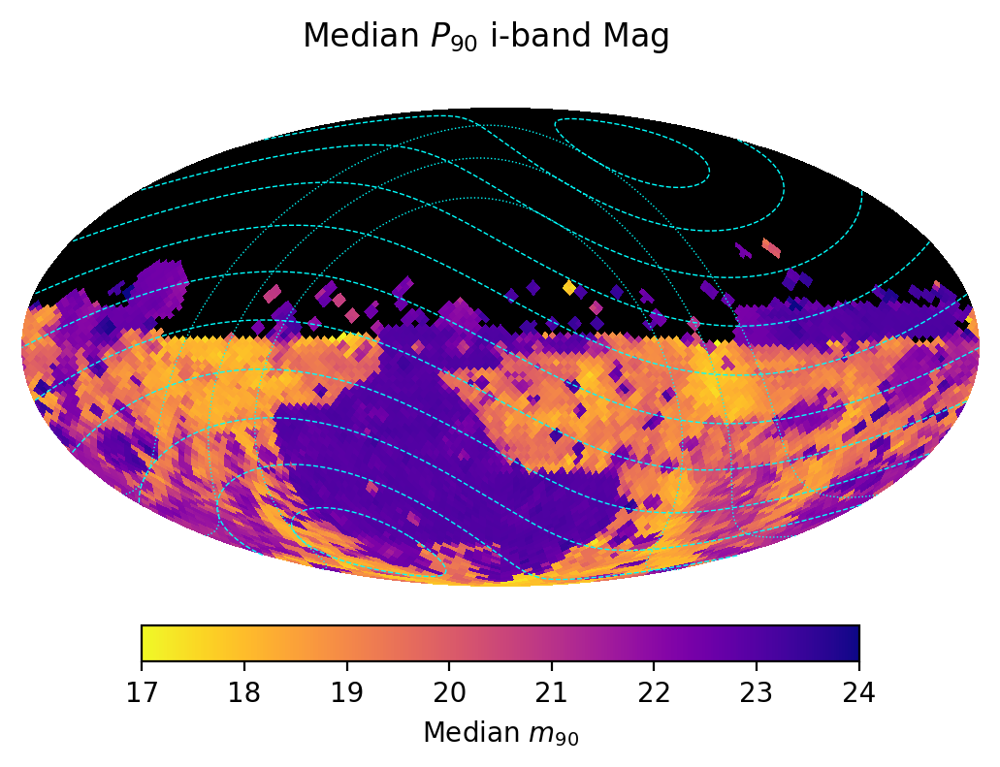

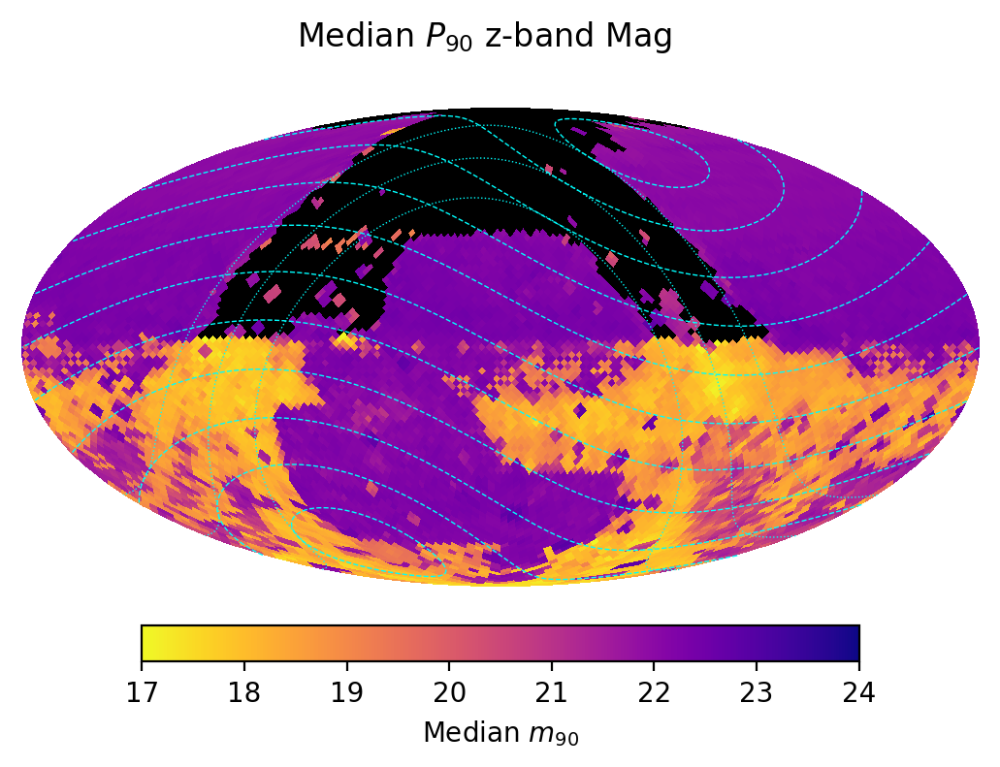

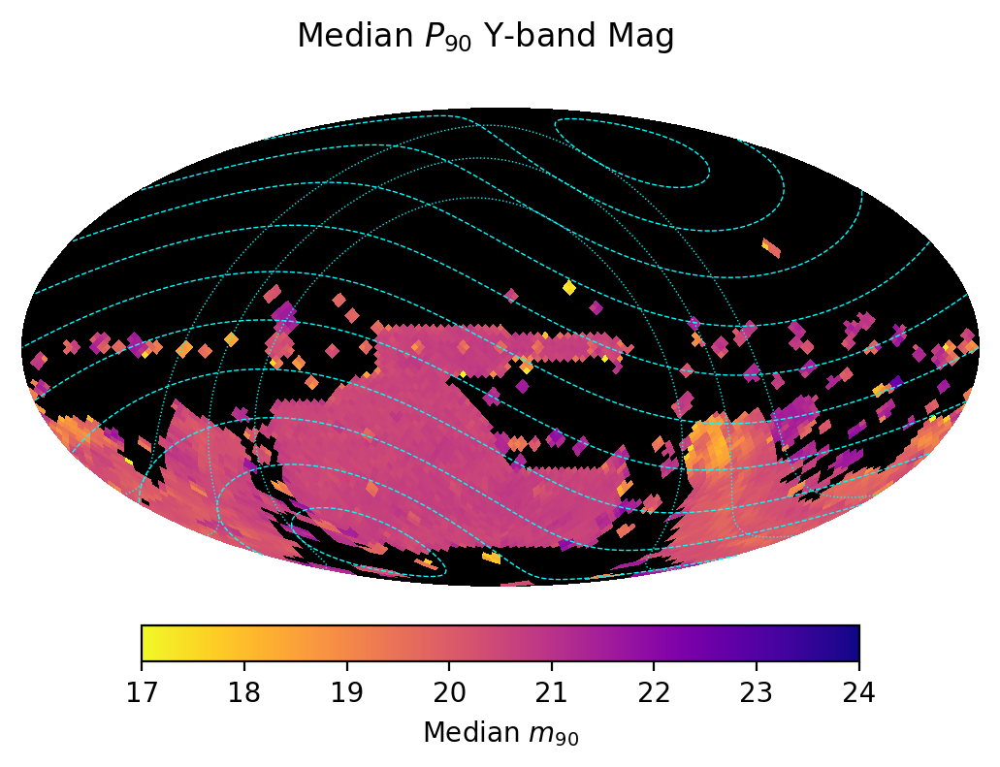

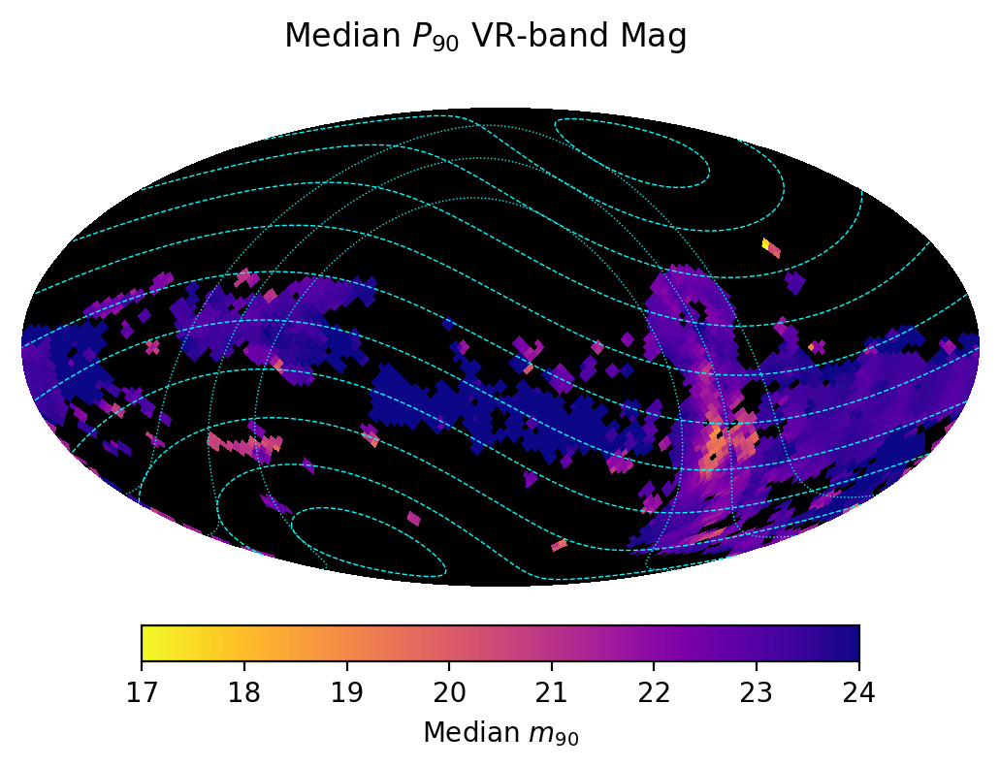

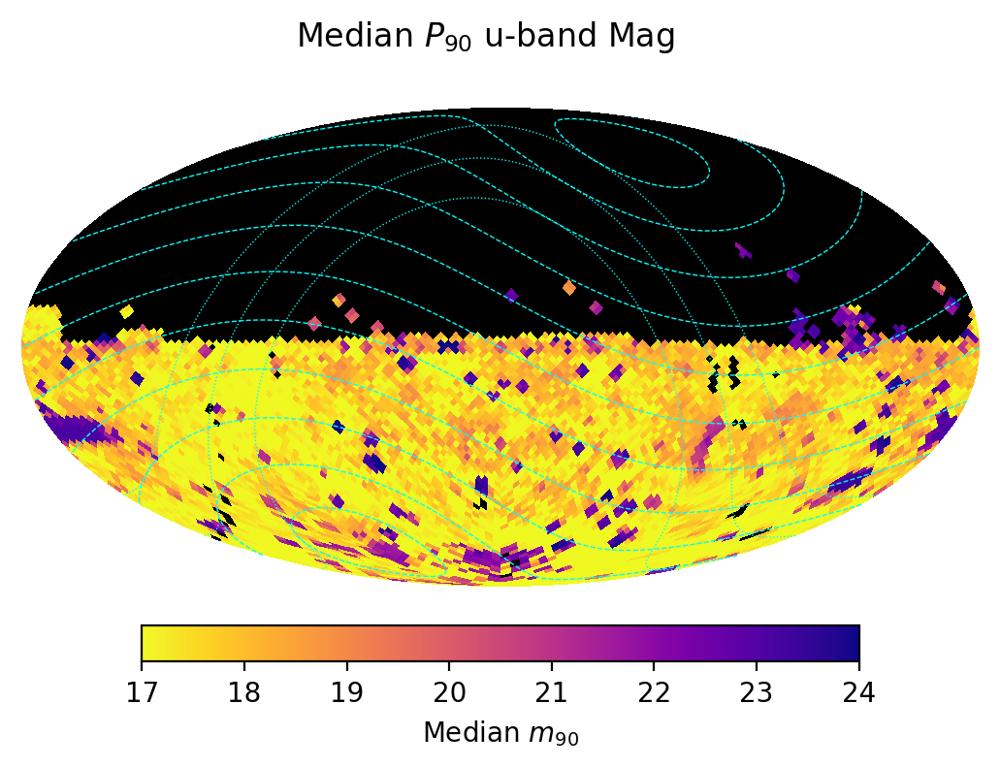

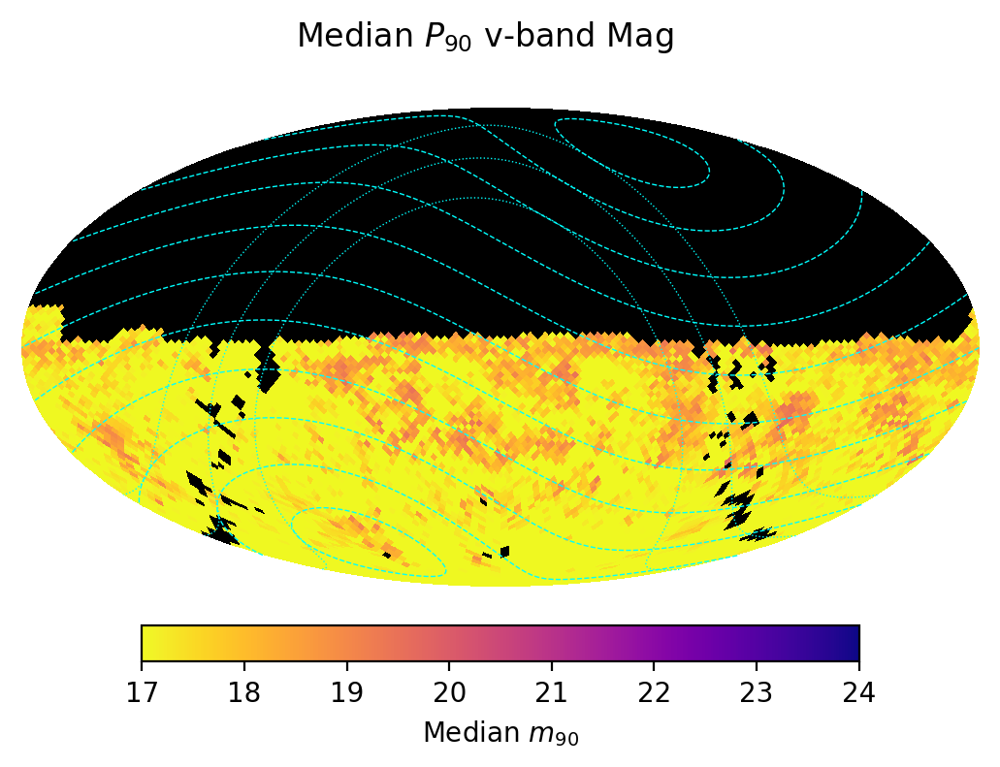

In [24]:
for filter_i in frames_av["filter"].unique():

    fig, ax = plt.subplots(1, 1, dpi=200)
    fig.suptitle(f"Median $P_{{90}}$ {filter_i}-band Mag", y=0.80)
    healpix_map, label = calculate_median_p90mag_map(frames_av[frames_av["filter"] == filter_i], nside=32)
    plot_map(fig, healpix_map, min=17, max=24, cmap="plasma_r", label=label)
    fig.savefig(f"plots/medianp_{filter_i}_coverage.png", dpi=200, bbox_inches="tight")

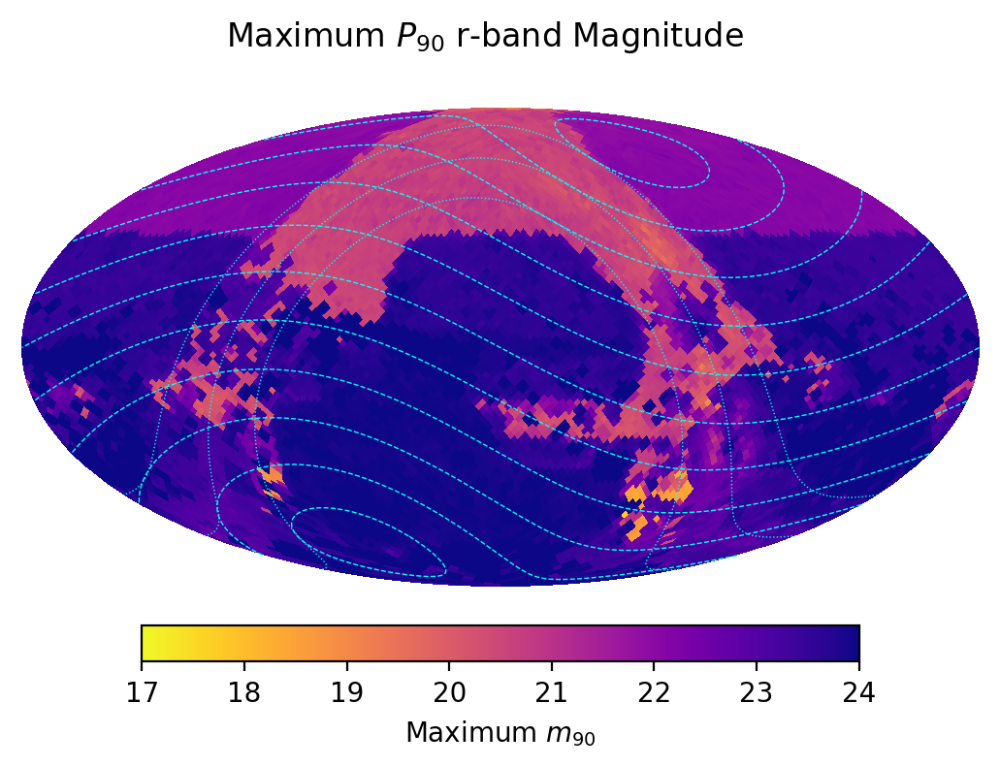

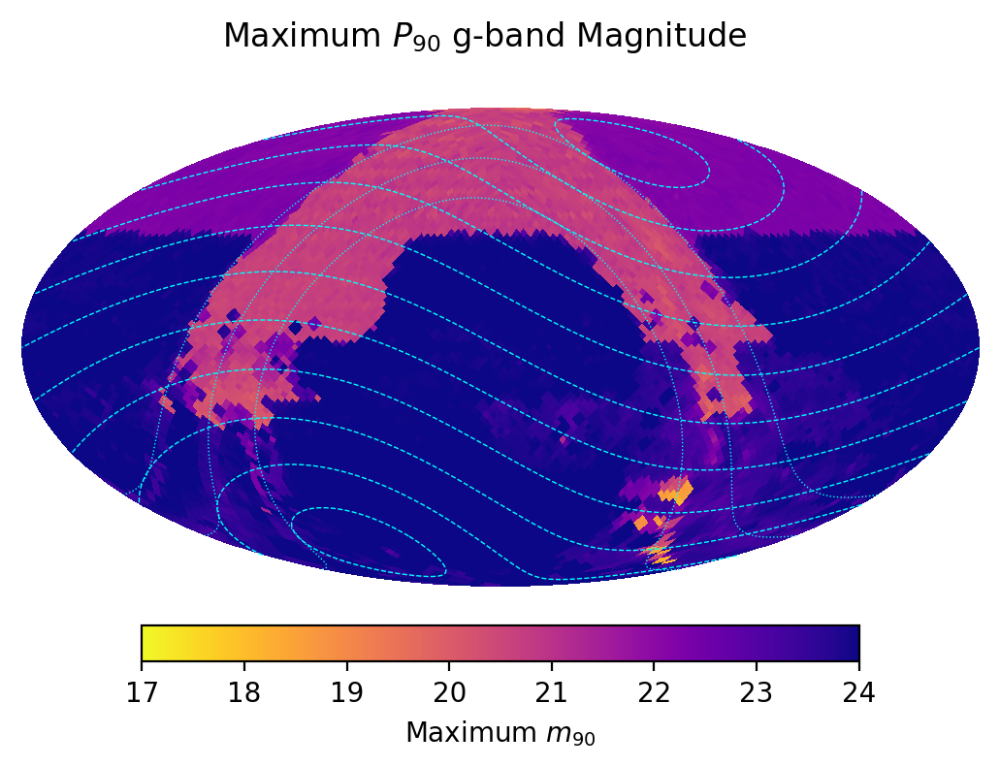

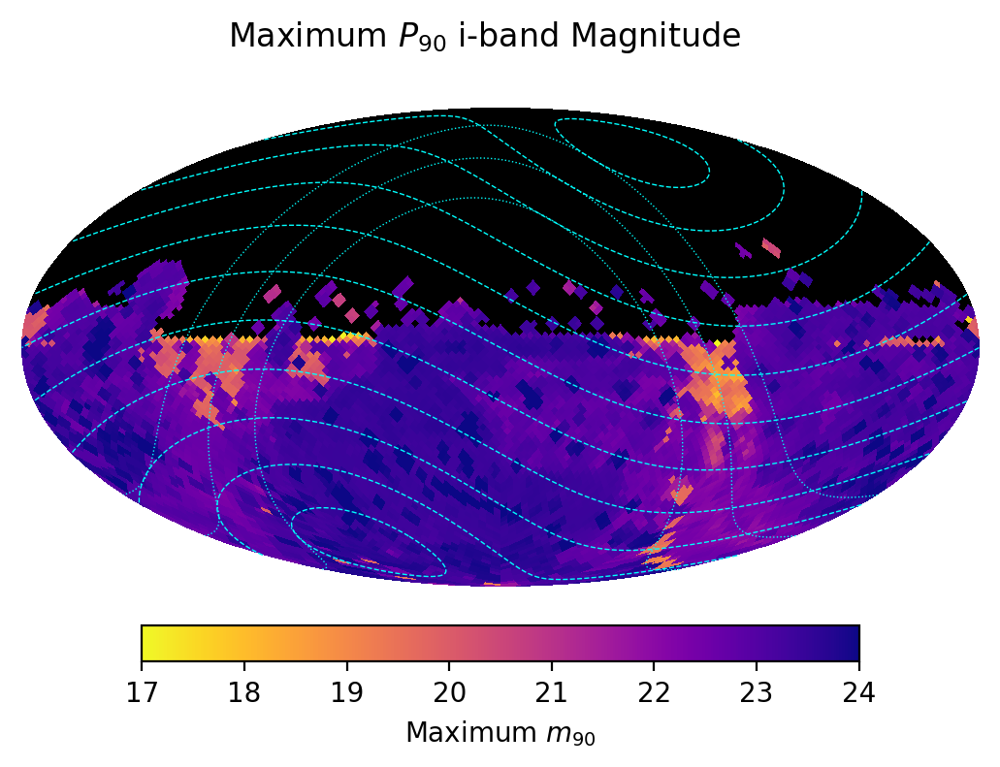

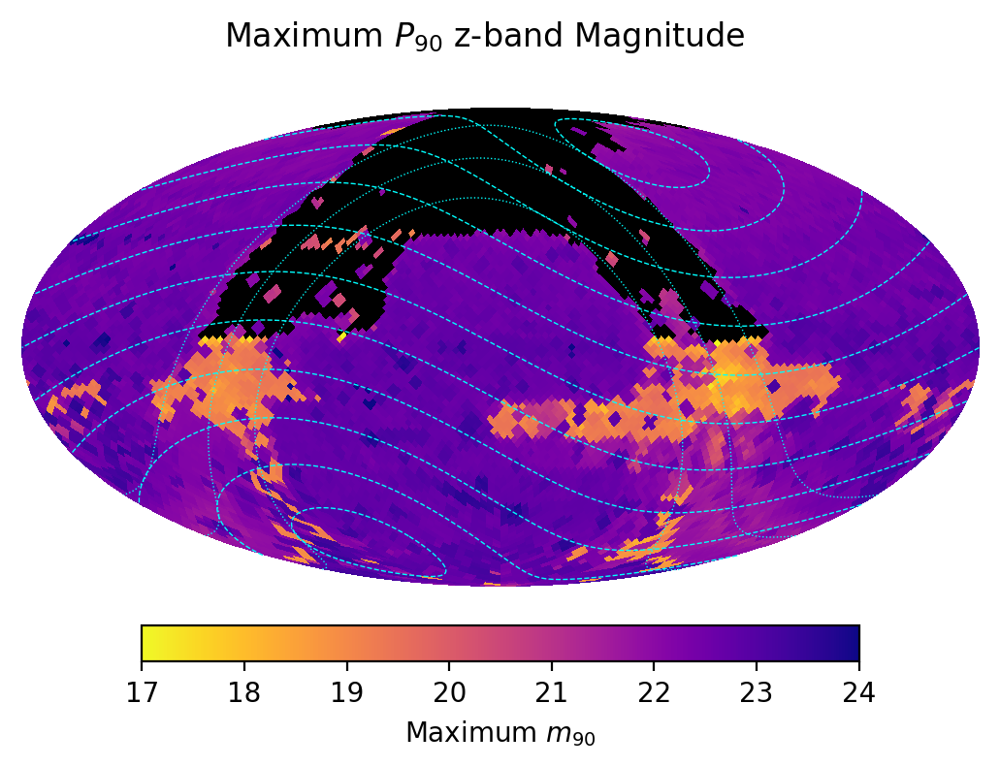

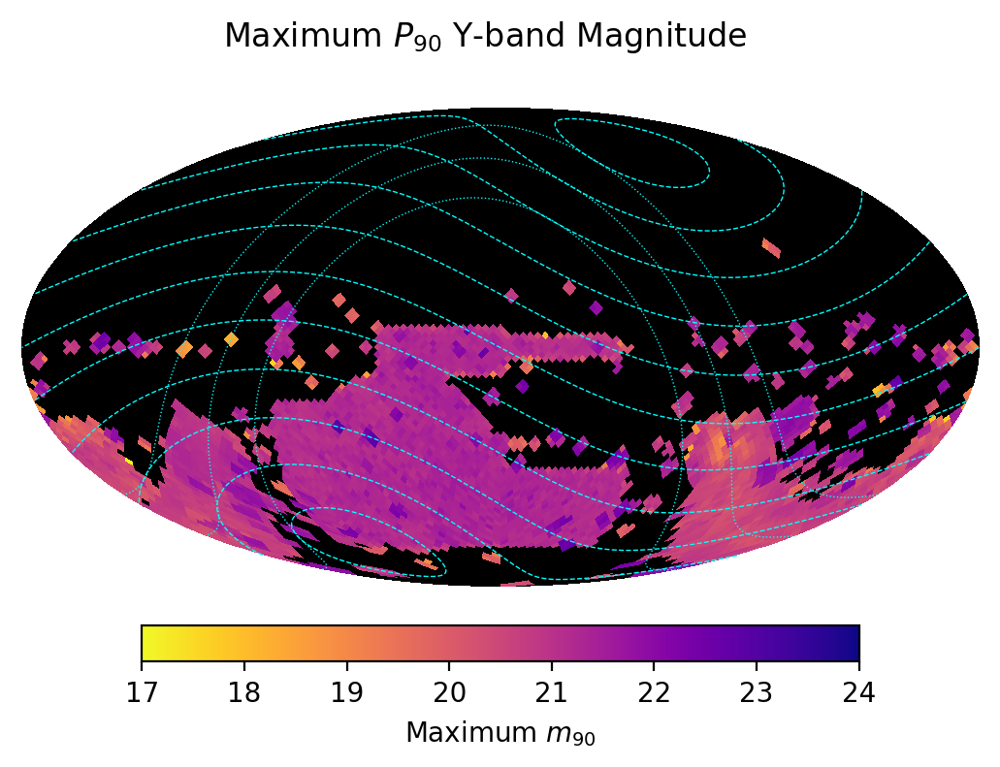

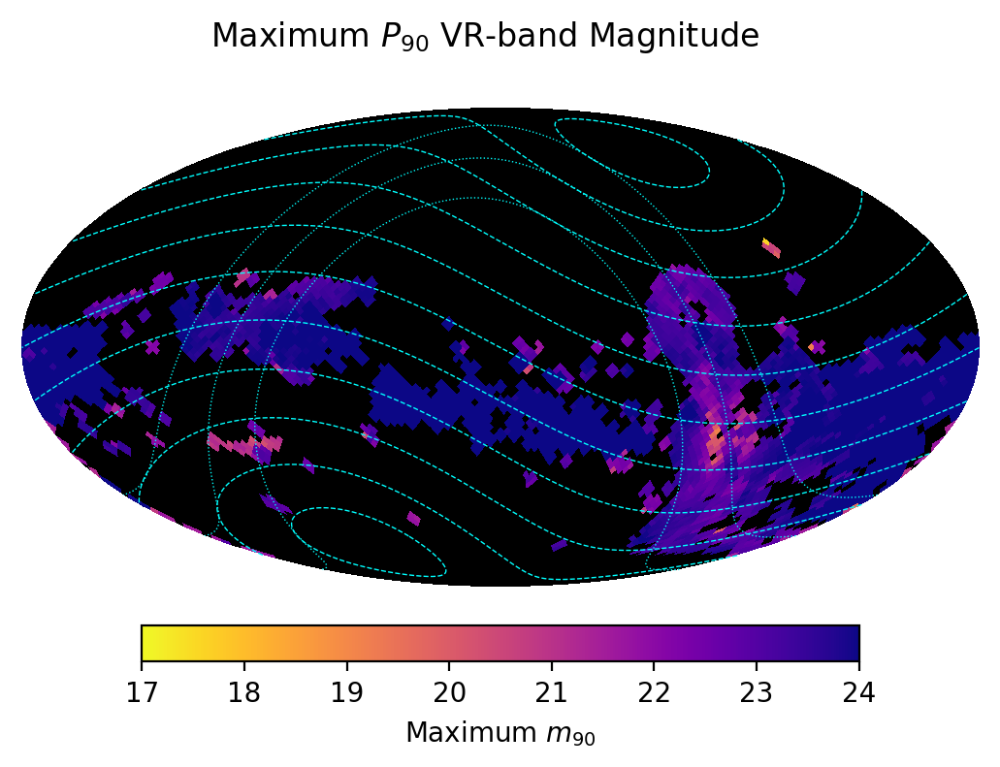

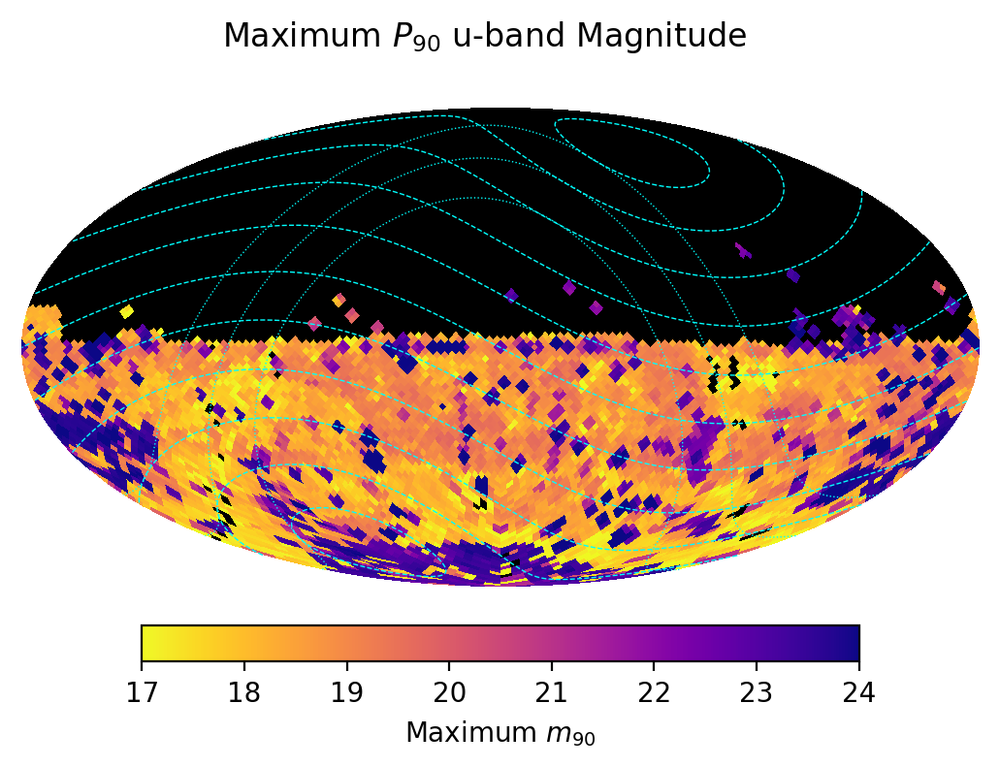

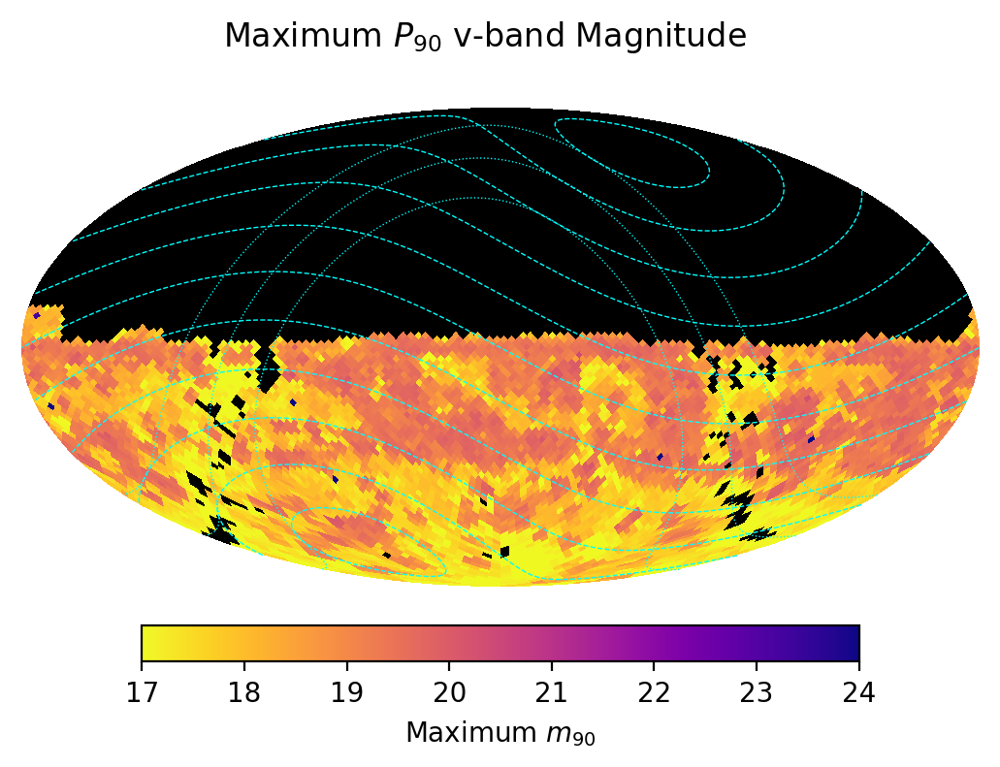

In [25]:
for filter_i in frames_av["filter"].unique():

    fig, ax = plt.subplots(1, 1, dpi=200)
    fig.suptitle(f"Maximum $P_{{90}}$ {filter_i}-band Magnitude", y=0.80)
    healpix_map, label = calculate_max_p90mag_map(frames_av[frames_av["filter"] == filter_i], nside=32)
    plot_map(fig, healpix_map, min=17, max=24, cmap="plasma_r", label=label)
    fig.savefig(f"plots/maximump90_{filter_i}_coverage.png", dpi=200, bbox_inches="tight")

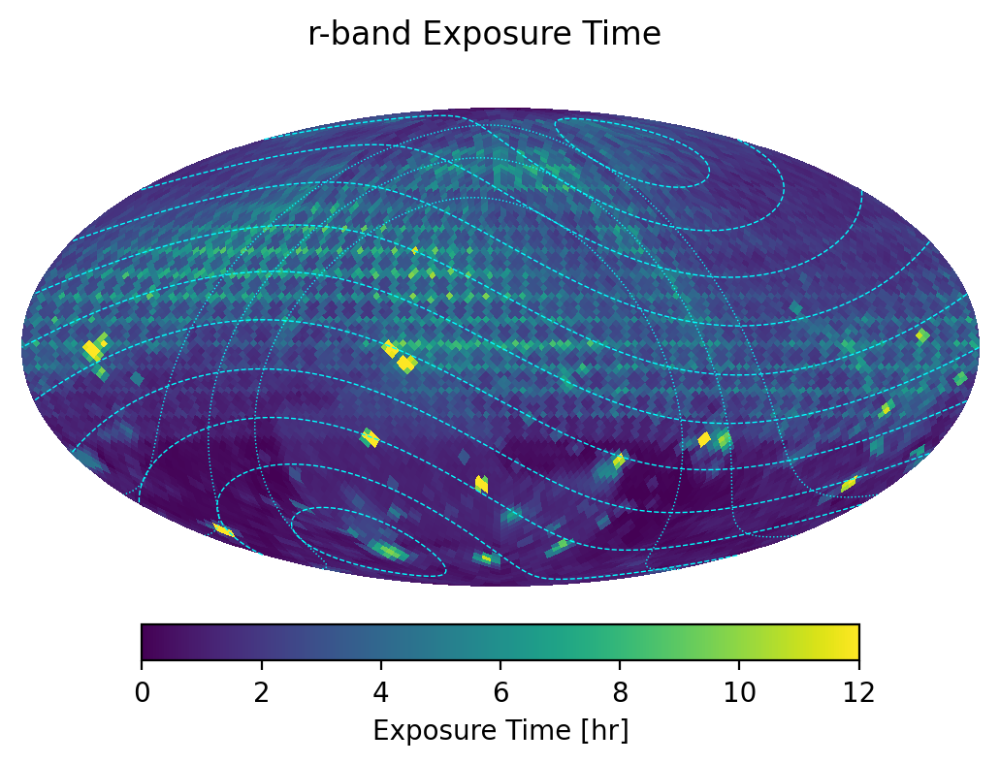

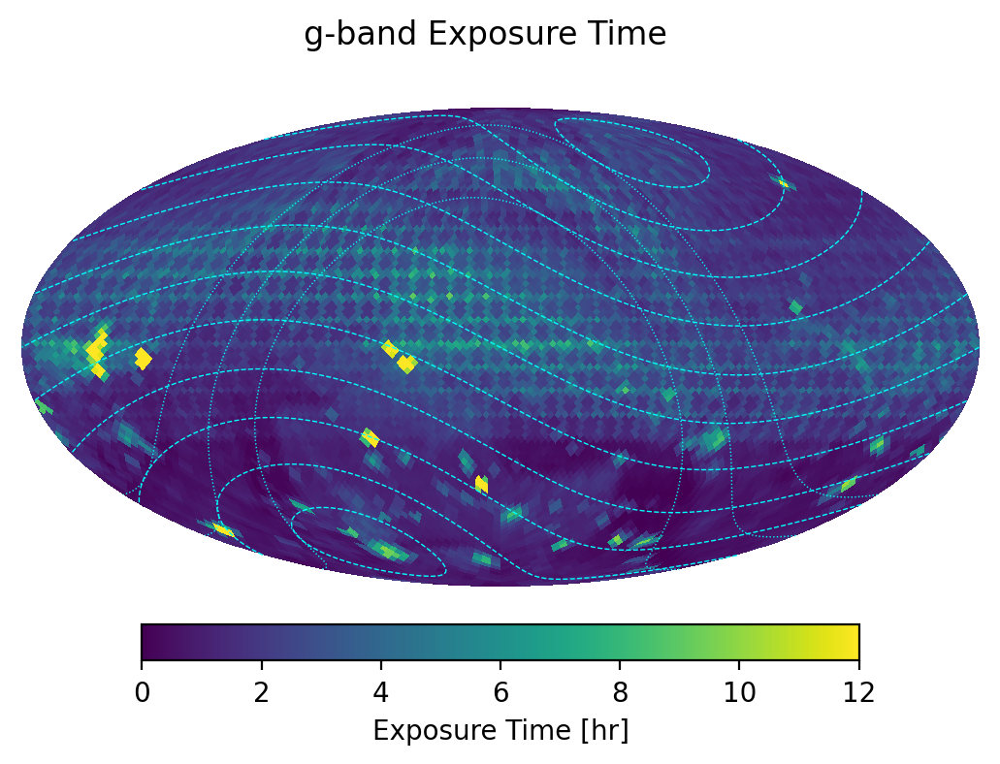

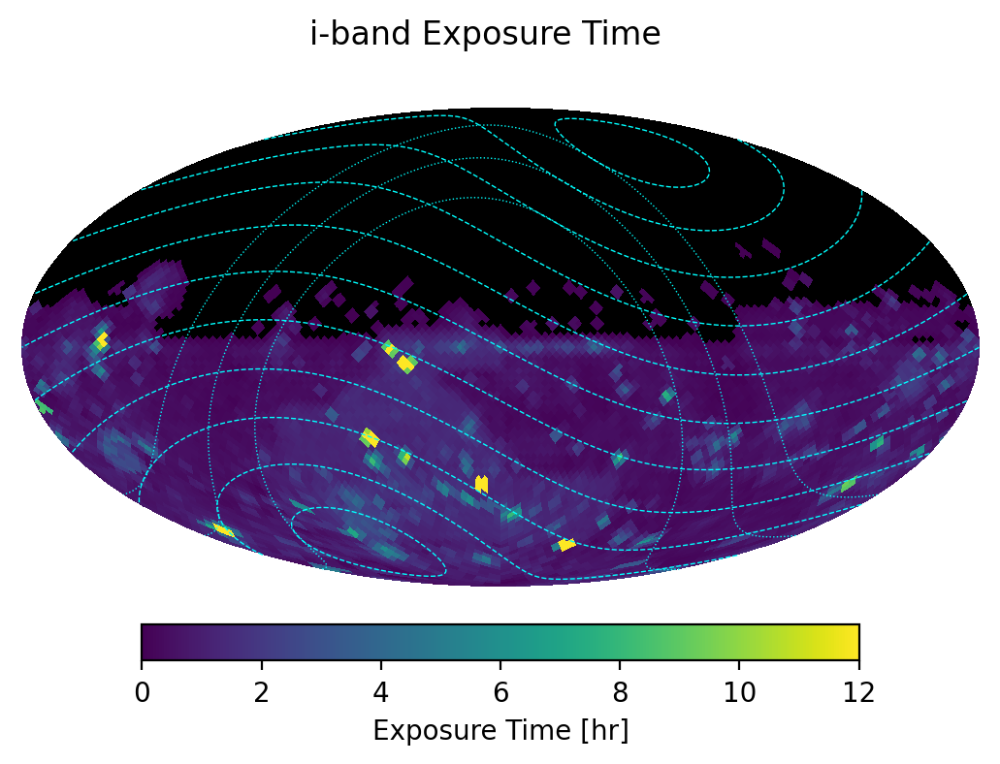

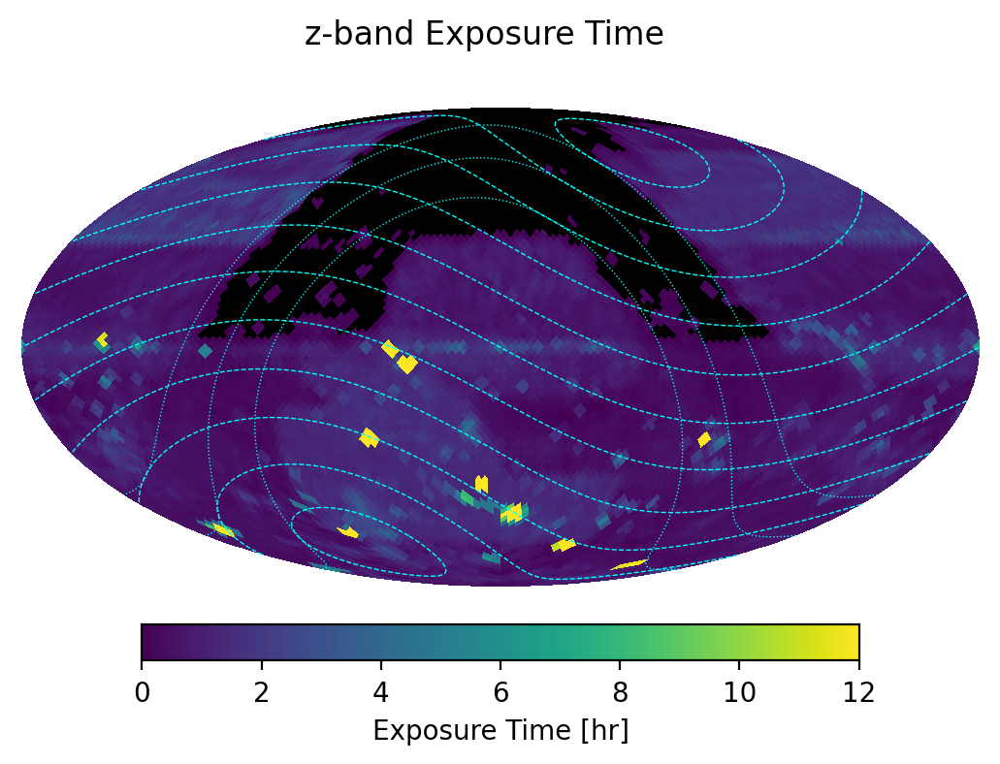

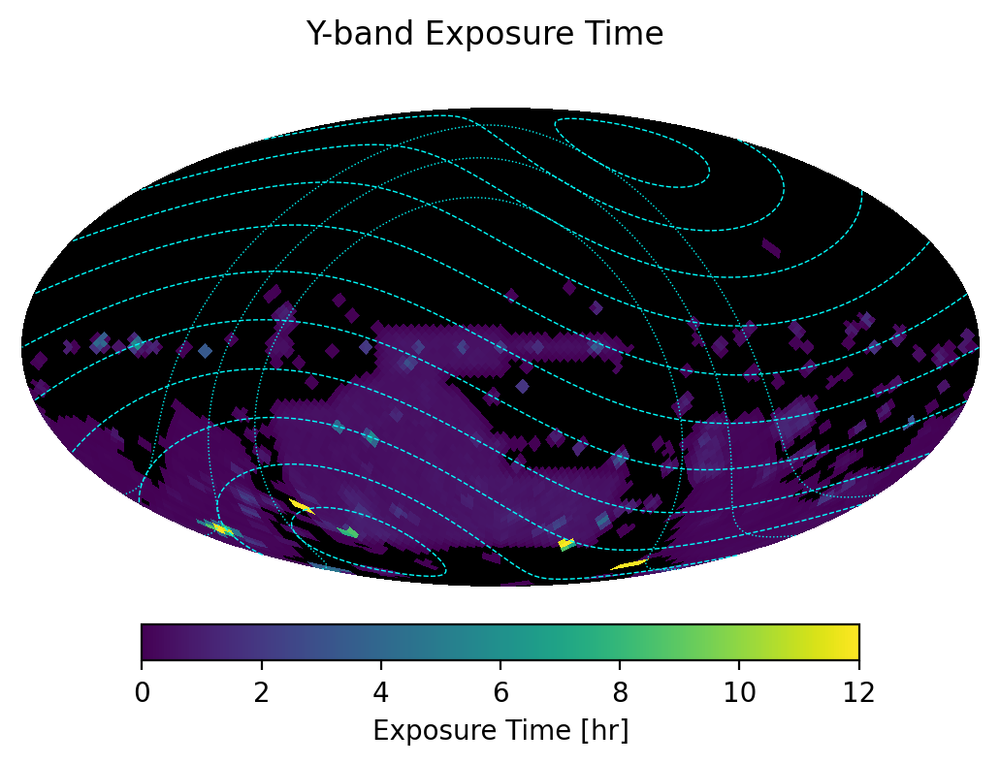

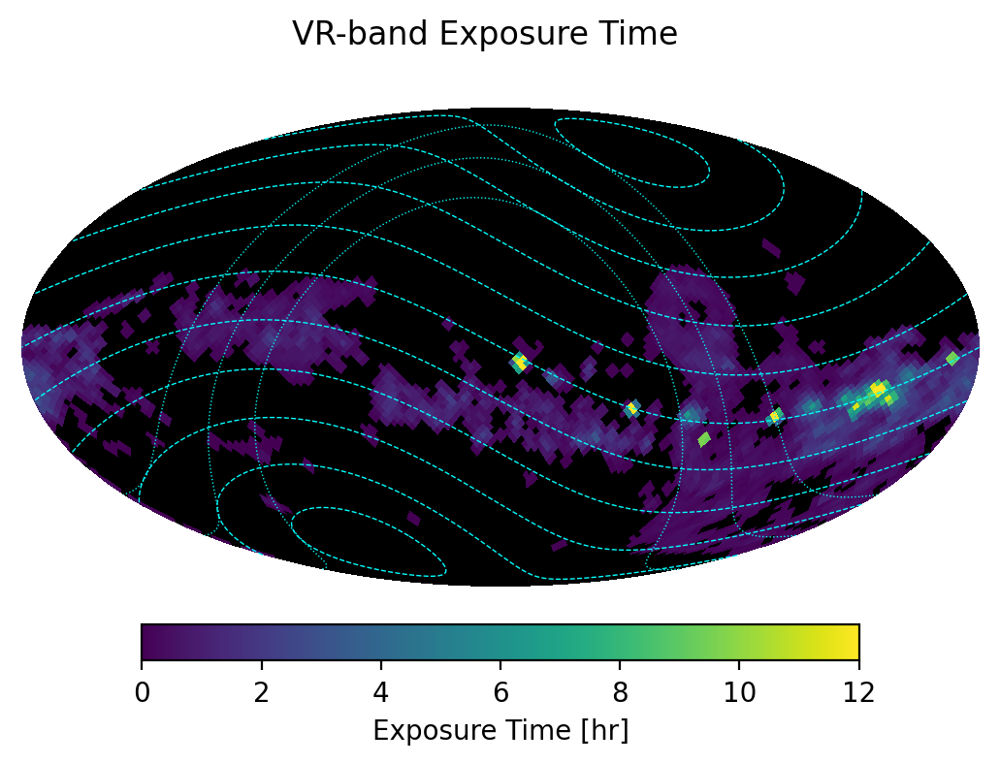

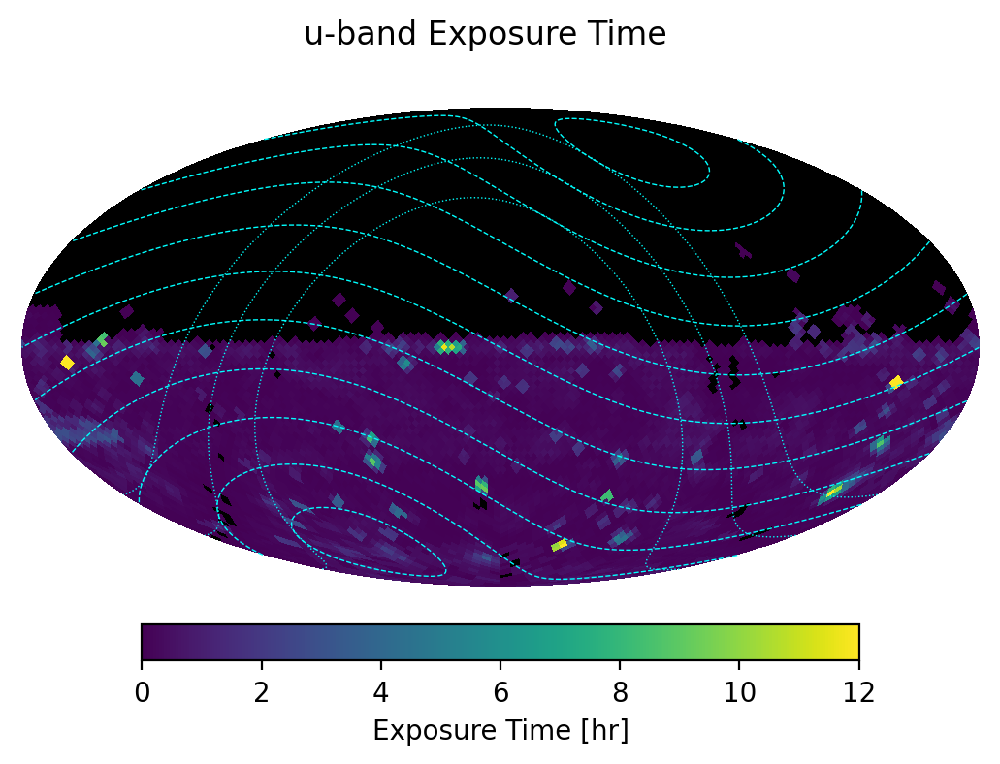

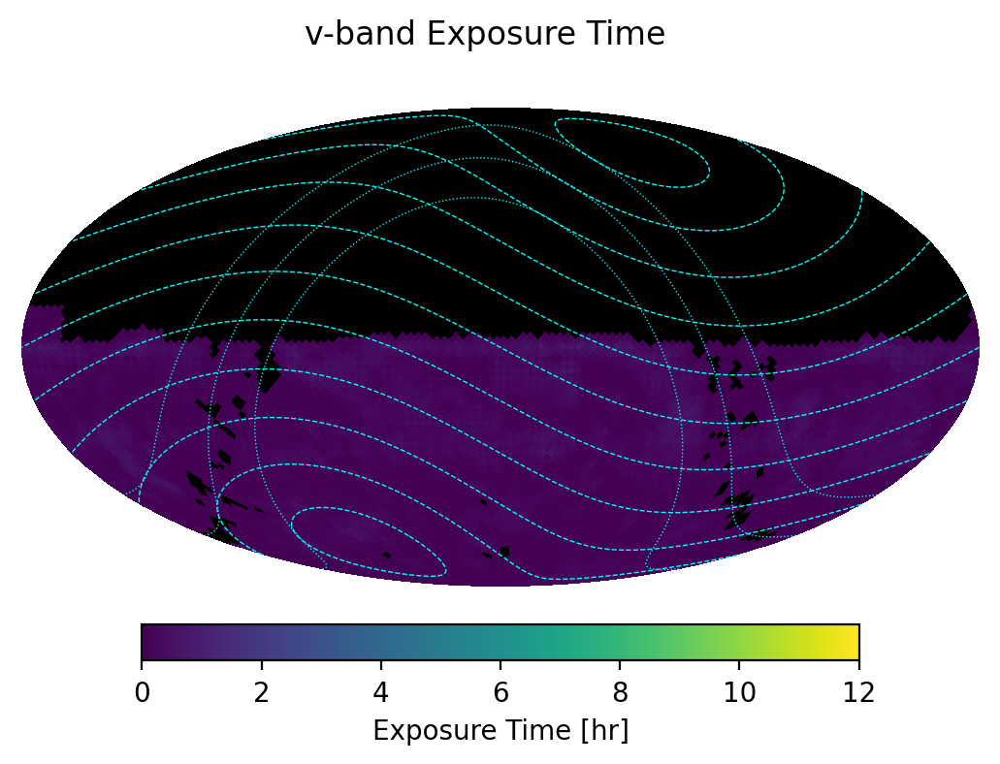

In [26]:
for filter_i in frames["filter"].unique():
    fig, ax = plt.subplots(1, 1, dpi=200)
    fig.suptitle(f"{filter_i}-band Exposure Time", y=0.80)
    healpix_map, label = calculate_exposure_map(frames[frames["filter"] == filter_i], nside=32)
    plot_map(fig, healpix_map, min=0, max=12, cmap="viridis", label=label)
    fig.savefig(f"plots/{filter_i}_exposure_time.png", dpi=200, bbox_inches="tight")